# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: cannot create directory ‘data’: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

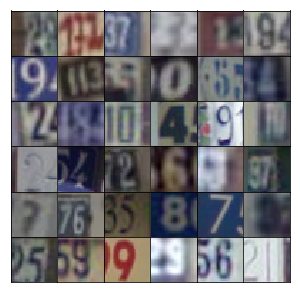

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3.

In [27]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        x1 = tf.layers.dense(z, 4*4*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        x1 = tf.layers.batch_normalization(x1, training=training)
        x1 = tf.maximum(alpha * x1, x1)
        # 4x4x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 256, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=training)
        x2 = tf.maximum(alpha * x2, x2)
        # 8x8x256 now
        
        x3 = tf.layers.conv2d_transpose(x2, 128, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3, training=training)
        x3 = tf.maximum(alpha * x3, x3)
        # 16x16x128 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x3, output_dim, 5, strides=2, padding='same')
        # 32x32x3 now
        
        out = tf.tanh(logits)
        
        return out

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've build before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU. 

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

In [34]:
def discriminator(x, reuse=False, alpha=0.2):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Input layer is 32x32x3
        x1 = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 16x16x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 8x8x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256

        # Flatten it
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [35]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [36]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [37]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=0.2)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [38]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [39]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

In [ ]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.001
batch_size = 64
epochs = 25
alpha = 0.1
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/25... Discriminator Loss: 0.0687... Generator Loss: 17.8079
Epoch 1/25... Discriminator Loss: 0.0467... Generator Loss: 3.6851
Epoch 1/25... Discriminator Loss: 0.0325... Generator Loss: 14.2593
Epoch 1/25... Discriminator Loss: 0.1763... Generator Loss: 2.1889
Epoch 1/25... Discriminator Loss: 0.7403... Generator Loss: 1.5476
Epoch 1/25... Discriminator Loss: 0.8477... Generator Loss: 2.2865
Epoch 1/25... Discriminator Loss: 0.7793... Generator Loss: 1.1618
Epoch 1/25... Discriminator Loss: 0.5054... Generator Loss: 1.5515
Epoch 1/25... Discriminator Loss: 2.0491... Generator Loss: 1.5975
Epoch 1/25... Discriminator Loss: 1.5857... Generator Loss: 0.3066


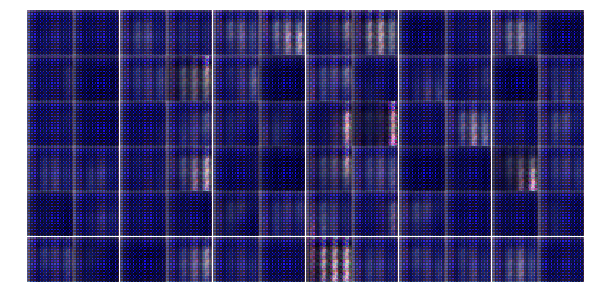

Epoch 1/25... Discriminator Loss: 0.9508... Generator Loss: 1.3942
Epoch 1/25... Discriminator Loss: 3.3678... Generator Loss: 0.2534
Epoch 1/25... Discriminator Loss: 0.7373... Generator Loss: 1.2832
Epoch 1/25... Discriminator Loss: 0.9613... Generator Loss: 0.6989
Epoch 1/25... Discriminator Loss: 0.4832... Generator Loss: 1.5129
Epoch 1/25... Discriminator Loss: 1.1086... Generator Loss: 0.9128
Epoch 1/25... Discriminator Loss: 0.8185... Generator Loss: 1.3291
Epoch 1/25... Discriminator Loss: 0.6205... Generator Loss: 3.0603
Epoch 1/25... Discriminator Loss: 0.2371... Generator Loss: 1.9203
Epoch 1/25... Discriminator Loss: 1.1226... Generator Loss: 0.7794


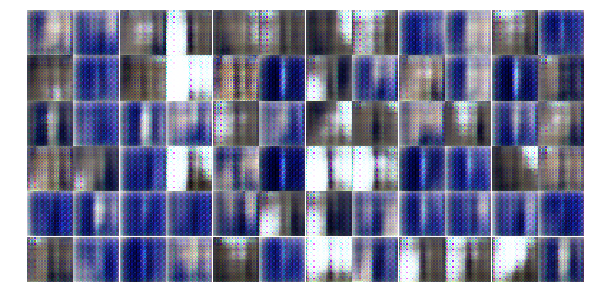

Epoch 1/25... Discriminator Loss: 0.3516... Generator Loss: 1.7503
Epoch 1/25... Discriminator Loss: 0.9217... Generator Loss: 0.7966
Epoch 1/25... Discriminator Loss: 0.9047... Generator Loss: 1.4807
Epoch 1/25... Discriminator Loss: 0.6991... Generator Loss: 1.0496
Epoch 1/25... Discriminator Loss: 1.1070... Generator Loss: 0.8296
Epoch 1/25... Discriminator Loss: 0.5793... Generator Loss: 1.3369
Epoch 1/25... Discriminator Loss: 1.0872... Generator Loss: 1.5969
Epoch 1/25... Discriminator Loss: 1.1310... Generator Loss: 1.4310
Epoch 1/25... Discriminator Loss: 1.3489... Generator Loss: 0.4640
Epoch 1/25... Discriminator Loss: 1.1989... Generator Loss: 1.1227


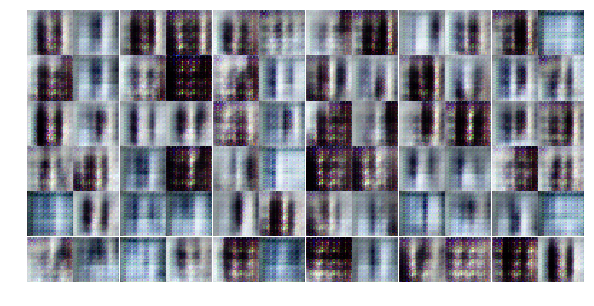

Epoch 1/25... Discriminator Loss: 2.8513... Generator Loss: 0.4770
Epoch 1/25... Discriminator Loss: 1.2324... Generator Loss: 0.7967
Epoch 1/25... Discriminator Loss: 0.9259... Generator Loss: 1.0155
Epoch 1/25... Discriminator Loss: 1.0784... Generator Loss: 0.8026
Epoch 1/25... Discriminator Loss: 0.8676... Generator Loss: 1.1027
Epoch 1/25... Discriminator Loss: 1.2005... Generator Loss: 0.6273
Epoch 1/25... Discriminator Loss: 1.6588... Generator Loss: 0.5671
Epoch 1/25... Discriminator Loss: 0.9990... Generator Loss: 1.4388
Epoch 1/25... Discriminator Loss: 0.9831... Generator Loss: 1.4923
Epoch 1/25... Discriminator Loss: 1.3887... Generator Loss: 1.2024


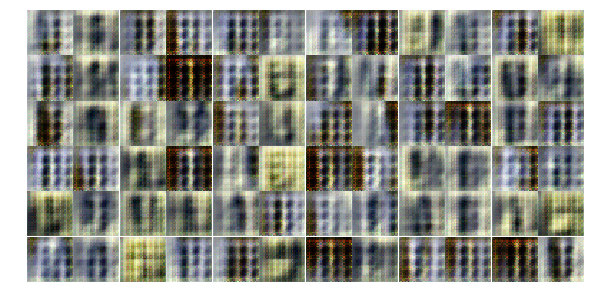

Epoch 1/25... Discriminator Loss: 1.6003... Generator Loss: 0.6077
Epoch 1/25... Discriminator Loss: 0.8634... Generator Loss: 1.7437
Epoch 1/25... Discriminator Loss: 1.2813... Generator Loss: 0.7189
Epoch 1/25... Discriminator Loss: 1.0308... Generator Loss: 0.9775
Epoch 1/25... Discriminator Loss: 0.8970... Generator Loss: 1.0897
Epoch 1/25... Discriminator Loss: 0.9215... Generator Loss: 0.8919
Epoch 1/25... Discriminator Loss: 0.4883... Generator Loss: 1.6396
Epoch 1/25... Discriminator Loss: 2.3859... Generator Loss: 1.1593
Epoch 1/25... Discriminator Loss: 1.1794... Generator Loss: 1.0660
Epoch 1/25... Discriminator Loss: 0.7891... Generator Loss: 1.1300


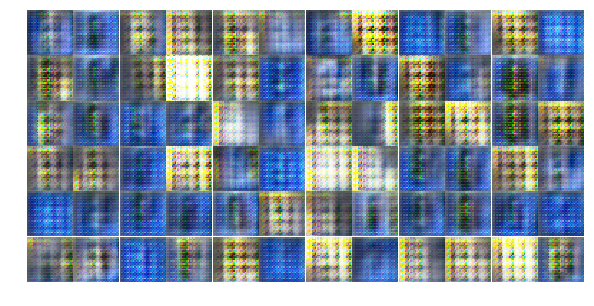

Epoch 1/25... Discriminator Loss: 0.9401... Generator Loss: 0.8854
Epoch 1/25... Discriminator Loss: 0.8347... Generator Loss: 1.0448
Epoch 1/25... Discriminator Loss: 2.4879... Generator Loss: 2.6437
Epoch 1/25... Discriminator Loss: 0.1867... Generator Loss: 2.7277
Epoch 1/25... Discriminator Loss: 1.3902... Generator Loss: 0.8469
Epoch 1/25... Discriminator Loss: 1.2584... Generator Loss: 0.8110
Epoch 1/25... Discriminator Loss: 1.0020... Generator Loss: 1.0899
Epoch 1/25... Discriminator Loss: 0.8692... Generator Loss: 1.1391
Epoch 1/25... Discriminator Loss: 1.3271... Generator Loss: 0.6926
Epoch 1/25... Discriminator Loss: 1.0371... Generator Loss: 1.2126


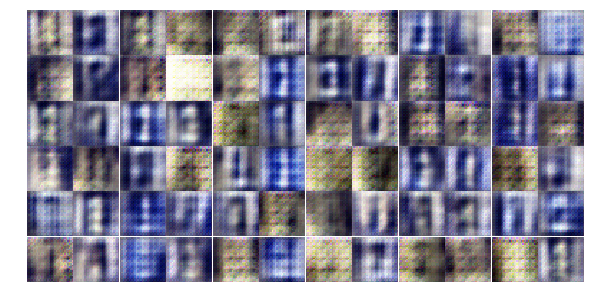

Epoch 1/25... Discriminator Loss: 1.5240... Generator Loss: 0.8956
Epoch 1/25... Discriminator Loss: 1.5161... Generator Loss: 0.4418
Epoch 1/25... Discriminator Loss: 0.9946... Generator Loss: 0.8855
Epoch 1/25... Discriminator Loss: 0.8844... Generator Loss: 1.0822
Epoch 1/25... Discriminator Loss: 1.1570... Generator Loss: 0.8111
Epoch 1/25... Discriminator Loss: 0.6622... Generator Loss: 1.1433
Epoch 1/25... Discriminator Loss: 0.6972... Generator Loss: 0.9988
Epoch 1/25... Discriminator Loss: 1.1321... Generator Loss: 0.8770
Epoch 1/25... Discriminator Loss: 0.9140... Generator Loss: 0.6900
Epoch 1/25... Discriminator Loss: 1.1770... Generator Loss: 1.1631


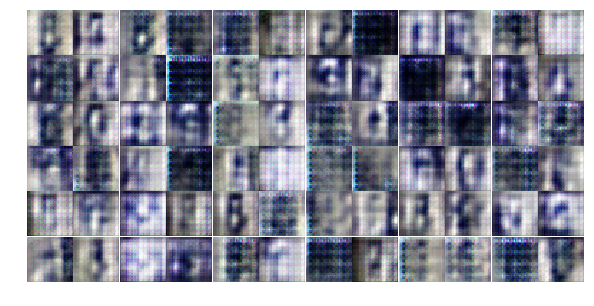

Epoch 1/25... Discriminator Loss: 0.8295... Generator Loss: 1.0226
Epoch 1/25... Discriminator Loss: 1.4926... Generator Loss: 0.5620
Epoch 1/25... Discriminator Loss: 1.0205... Generator Loss: 0.9269
Epoch 1/25... Discriminator Loss: 0.9539... Generator Loss: 0.8977
Epoch 1/25... Discriminator Loss: 0.7375... Generator Loss: 1.0320
Epoch 1/25... Discriminator Loss: 1.3591... Generator Loss: 0.5999
Epoch 1/25... Discriminator Loss: 0.8808... Generator Loss: 1.1488
Epoch 1/25... Discriminator Loss: 1.0115... Generator Loss: 1.2167
Epoch 1/25... Discriminator Loss: 0.9086... Generator Loss: 1.2076
Epoch 1/25... Discriminator Loss: 1.0994... Generator Loss: 0.6733


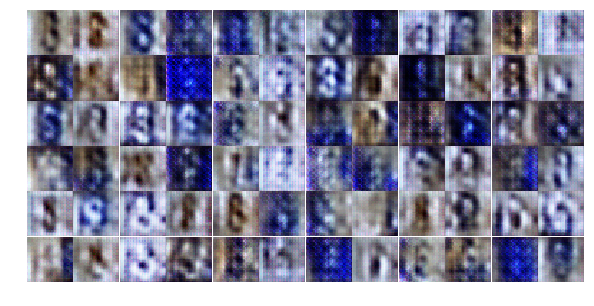

Epoch 1/25... Discriminator Loss: 1.2701... Generator Loss: 0.9364
Epoch 1/25... Discriminator Loss: 1.2620... Generator Loss: 0.6876
Epoch 1/25... Discriminator Loss: 0.9529... Generator Loss: 0.9687
Epoch 1/25... Discriminator Loss: 1.4792... Generator Loss: 0.8514
Epoch 1/25... Discriminator Loss: 1.2950... Generator Loss: 0.6903
Epoch 1/25... Discriminator Loss: 1.1685... Generator Loss: 0.8567
Epoch 1/25... Discriminator Loss: 1.0992... Generator Loss: 0.7608
Epoch 1/25... Discriminator Loss: 1.1446... Generator Loss: 1.3909
Epoch 1/25... Discriminator Loss: 1.4375... Generator Loss: 0.6382
Epoch 1/25... Discriminator Loss: 0.9784... Generator Loss: 0.9208


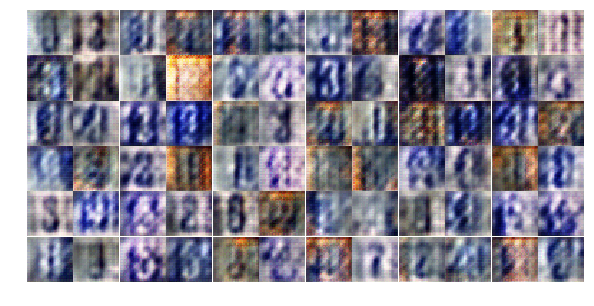

Epoch 1/25... Discriminator Loss: 1.1292... Generator Loss: 0.8255
Epoch 1/25... Discriminator Loss: 1.1421... Generator Loss: 0.8246
Epoch 1/25... Discriminator Loss: 1.0928... Generator Loss: 0.7787
Epoch 1/25... Discriminator Loss: 0.6695... Generator Loss: 0.8735
Epoch 1/25... Discriminator Loss: 1.1654... Generator Loss: 0.9210
Epoch 1/25... Discriminator Loss: 1.4853... Generator Loss: 0.5795
Epoch 1/25... Discriminator Loss: 1.2379... Generator Loss: 1.0483
Epoch 1/25... Discriminator Loss: 1.3557... Generator Loss: 0.8900
Epoch 1/25... Discriminator Loss: 1.3409... Generator Loss: 0.9626
Epoch 1/25... Discriminator Loss: 1.5687... Generator Loss: 0.6520


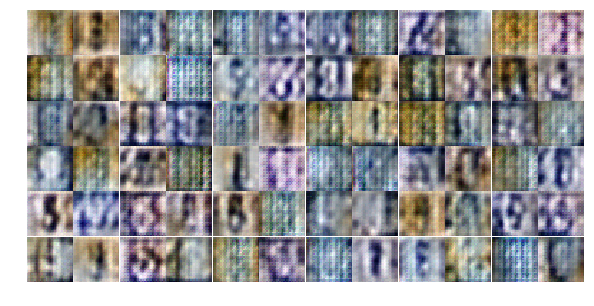

Epoch 1/25... Discriminator Loss: 1.1215... Generator Loss: 0.9713
Epoch 1/25... Discriminator Loss: 1.2525... Generator Loss: 0.8334
Epoch 1/25... Discriminator Loss: 2.2177... Generator Loss: 2.2028
Epoch 1/25... Discriminator Loss: 1.0557... Generator Loss: 1.3858
Epoch 1/25... Discriminator Loss: 1.7822... Generator Loss: 0.2860
Epoch 1/25... Discriminator Loss: 1.1797... Generator Loss: 0.8094
Epoch 1/25... Discriminator Loss: 1.9988... Generator Loss: 0.3786
Epoch 1/25... Discriminator Loss: 1.5531... Generator Loss: 0.6007
Epoch 1/25... Discriminator Loss: 1.2921... Generator Loss: 0.8118
Epoch 1/25... Discriminator Loss: 1.4424... Generator Loss: 0.6768


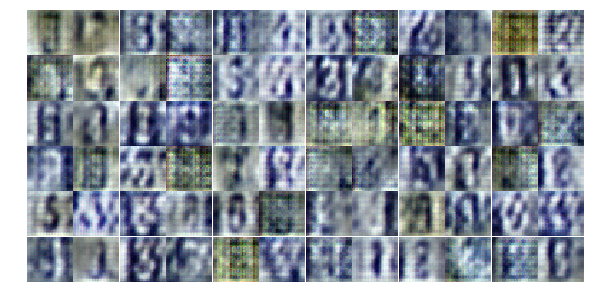

Epoch 1/25... Discriminator Loss: 1.0620... Generator Loss: 0.9972
Epoch 1/25... Discriminator Loss: 1.2156... Generator Loss: 0.7413
Epoch 1/25... Discriminator Loss: 1.3667... Generator Loss: 0.7698
Epoch 1/25... Discriminator Loss: 1.5200... Generator Loss: 0.7242
Epoch 2/25... Discriminator Loss: 1.2444... Generator Loss: 0.7419
Epoch 2/25... Discriminator Loss: 1.3213... Generator Loss: 0.6640
Epoch 2/25... Discriminator Loss: 1.2988... Generator Loss: 0.7897
Epoch 2/25... Discriminator Loss: 1.1754... Generator Loss: 0.8304
Epoch 2/25... Discriminator Loss: 1.4385... Generator Loss: 0.7064
Epoch 2/25... Discriminator Loss: 1.1228... Generator Loss: 0.8869


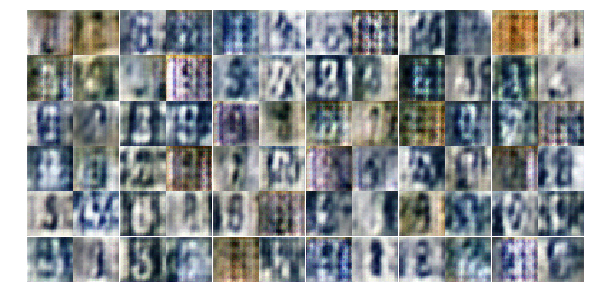

Epoch 2/25... Discriminator Loss: 1.2996... Generator Loss: 0.7971
Epoch 2/25... Discriminator Loss: 1.3966... Generator Loss: 0.8731
Epoch 2/25... Discriminator Loss: 1.2445... Generator Loss: 0.8400
Epoch 2/25... Discriminator Loss: 1.4496... Generator Loss: 0.5587
Epoch 2/25... Discriminator Loss: 0.8479... Generator Loss: 0.9044
Epoch 2/25... Discriminator Loss: 1.0825... Generator Loss: 0.9455
Epoch 2/25... Discriminator Loss: 1.3921... Generator Loss: 0.8059
Epoch 2/25... Discriminator Loss: 1.2276... Generator Loss: 0.7980
Epoch 2/25... Discriminator Loss: 1.3256... Generator Loss: 0.6870
Epoch 2/25... Discriminator Loss: 1.2057... Generator Loss: 0.8135


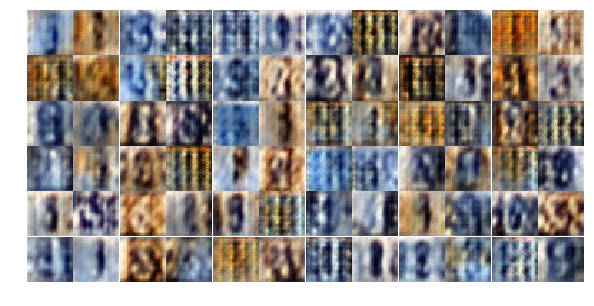

Epoch 2/25... Discriminator Loss: 1.3652... Generator Loss: 0.7480
Epoch 2/25... Discriminator Loss: 0.9901... Generator Loss: 0.8638
Epoch 2/25... Discriminator Loss: 1.4697... Generator Loss: 0.6205
Epoch 2/25... Discriminator Loss: 1.3452... Generator Loss: 0.7528
Epoch 2/25... Discriminator Loss: 1.4028... Generator Loss: 0.8460
Epoch 2/25... Discriminator Loss: 1.5170... Generator Loss: 0.4915
Epoch 2/25... Discriminator Loss: 1.1262... Generator Loss: 0.7326
Epoch 2/25... Discriminator Loss: 1.2219... Generator Loss: 0.9042
Epoch 2/25... Discriminator Loss: 1.0923... Generator Loss: 1.1369
Epoch 2/25... Discriminator Loss: 1.5826... Generator Loss: 0.7711


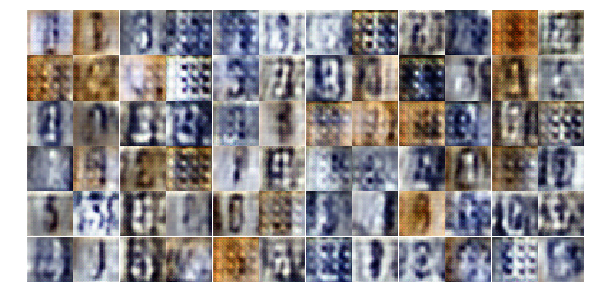

Epoch 2/25... Discriminator Loss: 1.3138... Generator Loss: 0.6652
Epoch 2/25... Discriminator Loss: 1.3459... Generator Loss: 0.7508
Epoch 2/25... Discriminator Loss: 1.2244... Generator Loss: 0.8099
Epoch 2/25... Discriminator Loss: 1.6088... Generator Loss: 0.6153
Epoch 2/25... Discriminator Loss: 1.2351... Generator Loss: 0.8350
Epoch 2/25... Discriminator Loss: 1.2633... Generator Loss: 0.6421
Epoch 2/25... Discriminator Loss: 1.5227... Generator Loss: 0.6813
Epoch 2/25... Discriminator Loss: 1.2745... Generator Loss: 0.8299
Epoch 2/25... Discriminator Loss: 1.3157... Generator Loss: 0.7323
Epoch 2/25... Discriminator Loss: 1.4942... Generator Loss: 0.4609


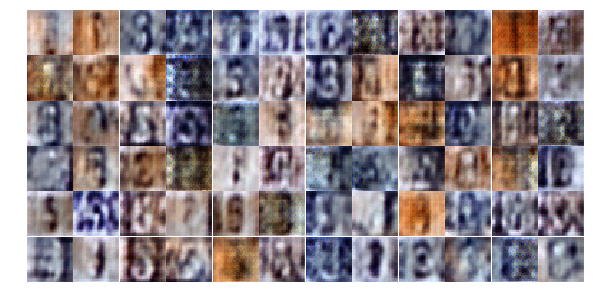

Epoch 2/25... Discriminator Loss: 1.1777... Generator Loss: 0.6522
Epoch 2/25... Discriminator Loss: 1.2101... Generator Loss: 0.7603
Epoch 2/25... Discriminator Loss: 1.2027... Generator Loss: 0.7699
Epoch 2/25... Discriminator Loss: 1.2972... Generator Loss: 0.7837
Epoch 2/25... Discriminator Loss: 1.3622... Generator Loss: 0.8351
Epoch 2/25... Discriminator Loss: 1.3003... Generator Loss: 0.7115
Epoch 2/25... Discriminator Loss: 1.4750... Generator Loss: 0.6780
Epoch 2/25... Discriminator Loss: 1.1278... Generator Loss: 0.9192
Epoch 2/25... Discriminator Loss: 1.1934... Generator Loss: 0.7373
Epoch 2/25... Discriminator Loss: 1.2897... Generator Loss: 0.6793


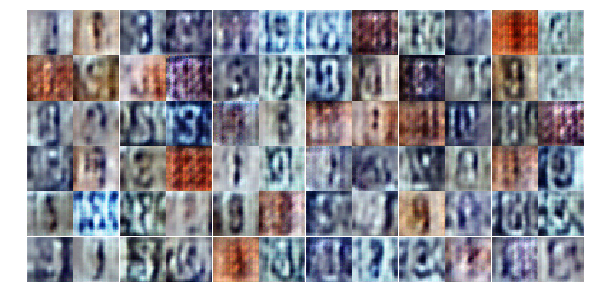

Epoch 2/25... Discriminator Loss: 1.2531... Generator Loss: 0.7156
Epoch 2/25... Discriminator Loss: 1.1758... Generator Loss: 0.8332
Epoch 2/25... Discriminator Loss: 1.5218... Generator Loss: 0.7240
Epoch 2/25... Discriminator Loss: 1.2154... Generator Loss: 0.7466
Epoch 2/25... Discriminator Loss: 1.1808... Generator Loss: 0.7834
Epoch 2/25... Discriminator Loss: 1.2167... Generator Loss: 0.6897
Epoch 2/25... Discriminator Loss: 1.3535... Generator Loss: 0.6120
Epoch 2/25... Discriminator Loss: 1.2750... Generator Loss: 0.9414
Epoch 2/25... Discriminator Loss: 1.2228... Generator Loss: 0.6833
Epoch 2/25... Discriminator Loss: 1.3480... Generator Loss: 0.6965


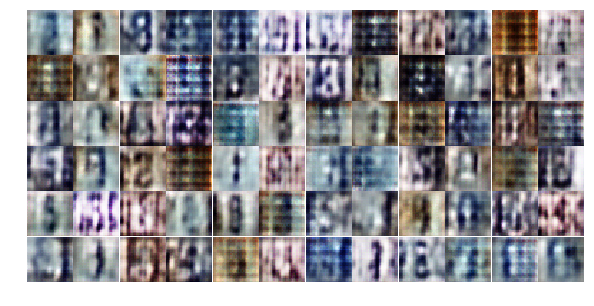

Epoch 2/25... Discriminator Loss: 1.3898... Generator Loss: 0.7380
Epoch 2/25... Discriminator Loss: 1.1338... Generator Loss: 0.7322
Epoch 2/25... Discriminator Loss: 1.4853... Generator Loss: 0.8823
Epoch 2/25... Discriminator Loss: 1.2971... Generator Loss: 0.7395
Epoch 2/25... Discriminator Loss: 1.1349... Generator Loss: 0.8545
Epoch 2/25... Discriminator Loss: 1.3654... Generator Loss: 0.6647
Epoch 2/25... Discriminator Loss: 1.2386... Generator Loss: 1.2340
Epoch 2/25... Discriminator Loss: 1.4626... Generator Loss: 1.0714
Epoch 2/25... Discriminator Loss: 1.3416... Generator Loss: 0.8365
Epoch 2/25... Discriminator Loss: 1.2374... Generator Loss: 0.8008


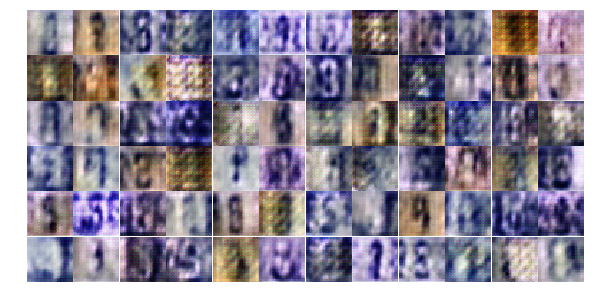

Epoch 2/25... Discriminator Loss: 1.3876... Generator Loss: 0.7110
Epoch 2/25... Discriminator Loss: 1.2916... Generator Loss: 0.7504
Epoch 2/25... Discriminator Loss: 1.4696... Generator Loss: 0.6699
Epoch 2/25... Discriminator Loss: 1.5098... Generator Loss: 0.6397
Epoch 2/25... Discriminator Loss: 1.3730... Generator Loss: 0.7959
Epoch 2/25... Discriminator Loss: 0.9601... Generator Loss: 0.9672
Epoch 2/25... Discriminator Loss: 1.1477... Generator Loss: 0.7304
Epoch 2/25... Discriminator Loss: 1.2204... Generator Loss: 0.6485
Epoch 2/25... Discriminator Loss: 1.2310... Generator Loss: 0.8007
Epoch 2/25... Discriminator Loss: 1.1749... Generator Loss: 0.8345


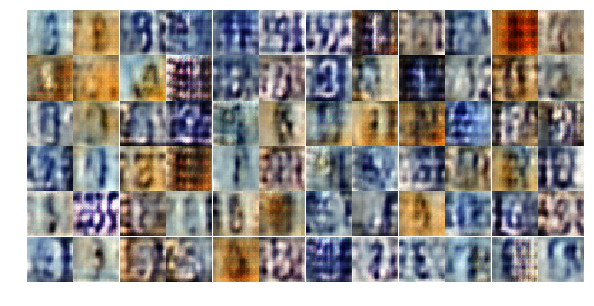

Epoch 2/25... Discriminator Loss: 1.2242... Generator Loss: 0.7867
Epoch 2/25... Discriminator Loss: 1.0809... Generator Loss: 0.9547
Epoch 2/25... Discriminator Loss: 1.1890... Generator Loss: 0.7849
Epoch 2/25... Discriminator Loss: 1.2679... Generator Loss: 0.7700
Epoch 2/25... Discriminator Loss: 1.2003... Generator Loss: 0.6923
Epoch 2/25... Discriminator Loss: 1.3502... Generator Loss: 0.7425
Epoch 2/25... Discriminator Loss: 1.4215... Generator Loss: 0.8277
Epoch 2/25... Discriminator Loss: 1.1256... Generator Loss: 0.8106
Epoch 2/25... Discriminator Loss: 1.1962... Generator Loss: 0.7677
Epoch 2/25... Discriminator Loss: 1.2372... Generator Loss: 0.5545


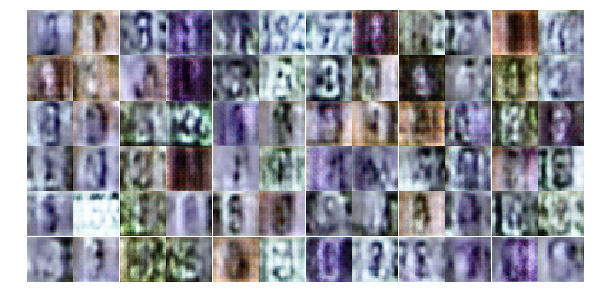

Epoch 2/25... Discriminator Loss: 1.1705... Generator Loss: 0.7674
Epoch 2/25... Discriminator Loss: 1.5233... Generator Loss: 0.4046
Epoch 2/25... Discriminator Loss: 1.2980... Generator Loss: 0.8909
Epoch 2/25... Discriminator Loss: 1.3128... Generator Loss: 0.8056
Epoch 2/25... Discriminator Loss: 1.4029... Generator Loss: 0.7561
Epoch 2/25... Discriminator Loss: 1.3666... Generator Loss: 0.9256
Epoch 2/25... Discriminator Loss: 1.2503... Generator Loss: 0.7796
Epoch 2/25... Discriminator Loss: 1.2929... Generator Loss: 0.7298
Epoch 2/25... Discriminator Loss: 1.2470... Generator Loss: 0.7318
Epoch 2/25... Discriminator Loss: 1.4849... Generator Loss: 0.5891


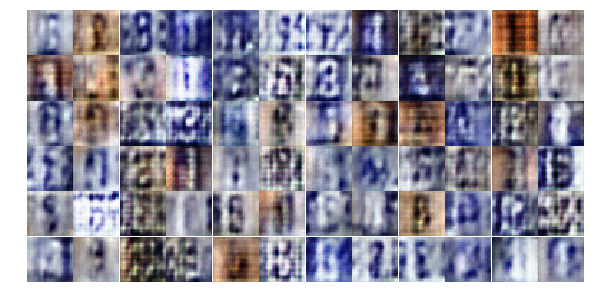

Epoch 2/25... Discriminator Loss: 1.1389... Generator Loss: 0.8553
Epoch 2/25... Discriminator Loss: 0.9354... Generator Loss: 1.0190
Epoch 2/25... Discriminator Loss: 1.3950... Generator Loss: 0.6770
Epoch 2/25... Discriminator Loss: 1.3720... Generator Loss: 0.4742
Epoch 2/25... Discriminator Loss: 1.3498... Generator Loss: 0.6910
Epoch 2/25... Discriminator Loss: 1.3456... Generator Loss: 0.8662
Epoch 2/25... Discriminator Loss: 1.4433... Generator Loss: 0.6992
Epoch 2/25... Discriminator Loss: 1.3251... Generator Loss: 0.6122
Epoch 2/25... Discriminator Loss: 1.2661... Generator Loss: 0.6737
Epoch 2/25... Discriminator Loss: 1.5087... Generator Loss: 0.7412


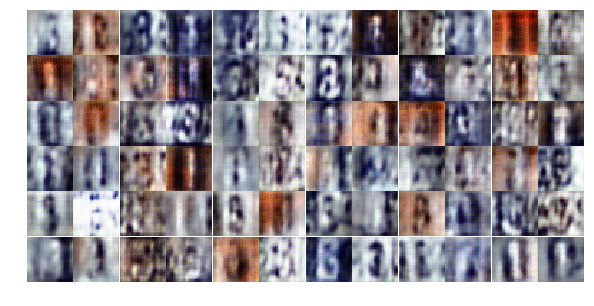

Epoch 2/25... Discriminator Loss: 1.2656... Generator Loss: 0.7224
Epoch 2/25... Discriminator Loss: 1.3970... Generator Loss: 0.7129
Epoch 2/25... Discriminator Loss: 1.2187... Generator Loss: 0.6147
Epoch 2/25... Discriminator Loss: 1.2144... Generator Loss: 0.8342
Epoch 2/25... Discriminator Loss: 1.4279... Generator Loss: 1.0099
Epoch 2/25... Discriminator Loss: 1.2319... Generator Loss: 1.0317
Epoch 2/25... Discriminator Loss: 1.3399... Generator Loss: 0.7027
Epoch 2/25... Discriminator Loss: 0.9867... Generator Loss: 0.9285
Epoch 2/25... Discriminator Loss: 1.1441... Generator Loss: 0.8870
Epoch 3/25... Discriminator Loss: 1.2979... Generator Loss: 0.7938


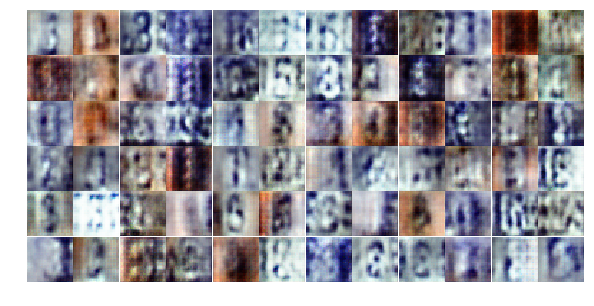

Epoch 3/25... Discriminator Loss: 1.2584... Generator Loss: 0.7732
Epoch 3/25... Discriminator Loss: 1.2053... Generator Loss: 0.7965
Epoch 3/25... Discriminator Loss: 1.3084... Generator Loss: 0.6594
Epoch 3/25... Discriminator Loss: 1.0440... Generator Loss: 1.1758
Epoch 3/25... Discriminator Loss: 1.1214... Generator Loss: 1.0375
Epoch 3/25... Discriminator Loss: 1.4204... Generator Loss: 0.6118
Epoch 3/25... Discriminator Loss: 1.2379... Generator Loss: 0.7617
Epoch 3/25... Discriminator Loss: 1.2467... Generator Loss: 0.7794
Epoch 3/25... Discriminator Loss: 1.3197... Generator Loss: 0.5484
Epoch 3/25... Discriminator Loss: 1.2169... Generator Loss: 1.0109


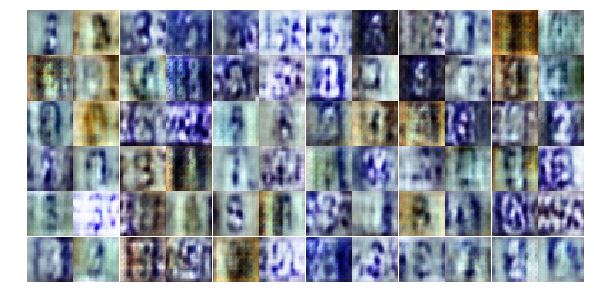

Epoch 3/25... Discriminator Loss: 1.0588... Generator Loss: 0.8510
Epoch 3/25... Discriminator Loss: 1.2216... Generator Loss: 0.7679
Epoch 3/25... Discriminator Loss: 1.1069... Generator Loss: 0.9346
Epoch 3/25... Discriminator Loss: 1.0896... Generator Loss: 0.7074
Epoch 3/25... Discriminator Loss: 1.0937... Generator Loss: 1.0290
Epoch 3/25... Discriminator Loss: 1.3069... Generator Loss: 1.5416
Epoch 3/25... Discriminator Loss: 1.0631... Generator Loss: 1.0527
Epoch 3/25... Discriminator Loss: 1.2963... Generator Loss: 0.8088
Epoch 3/25... Discriminator Loss: 1.2246... Generator Loss: 0.7050
Epoch 3/25... Discriminator Loss: 0.8377... Generator Loss: 1.1194


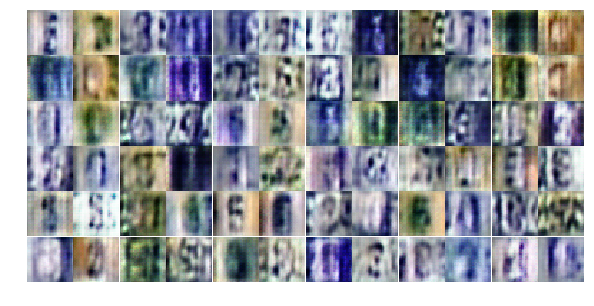

Epoch 3/25... Discriminator Loss: 1.2623... Generator Loss: 0.8416
Epoch 3/25... Discriminator Loss: 1.1569... Generator Loss: 1.0685
Epoch 3/25... Discriminator Loss: 1.0158... Generator Loss: 1.0076
Epoch 3/25... Discriminator Loss: 1.2392... Generator Loss: 0.7919
Epoch 3/25... Discriminator Loss: 1.0653... Generator Loss: 0.7776
Epoch 3/25... Discriminator Loss: 1.2633... Generator Loss: 0.8042
Epoch 3/25... Discriminator Loss: 1.1465... Generator Loss: 0.8188
Epoch 3/25... Discriminator Loss: 1.3024... Generator Loss: 0.6318
Epoch 3/25... Discriminator Loss: 1.2095... Generator Loss: 0.5607
Epoch 3/25... Discriminator Loss: 1.4614... Generator Loss: 0.9360


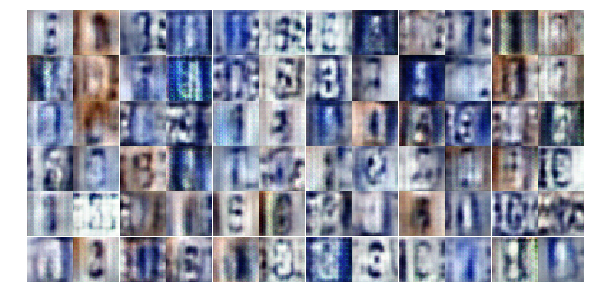

Epoch 3/25... Discriminator Loss: 1.1439... Generator Loss: 1.0572
Epoch 3/25... Discriminator Loss: 1.4032... Generator Loss: 0.9530
Epoch 3/25... Discriminator Loss: 1.1961... Generator Loss: 0.8615
Epoch 3/25... Discriminator Loss: 0.9956... Generator Loss: 0.9300
Epoch 3/25... Discriminator Loss: 1.2190... Generator Loss: 0.9811
Epoch 3/25... Discriminator Loss: 1.2022... Generator Loss: 0.9665
Epoch 3/25... Discriminator Loss: 1.1874... Generator Loss: 0.6052
Epoch 3/25... Discriminator Loss: 1.0808... Generator Loss: 0.9976
Epoch 3/25... Discriminator Loss: 1.3218... Generator Loss: 0.7870
Epoch 3/25... Discriminator Loss: 1.0124... Generator Loss: 0.8807


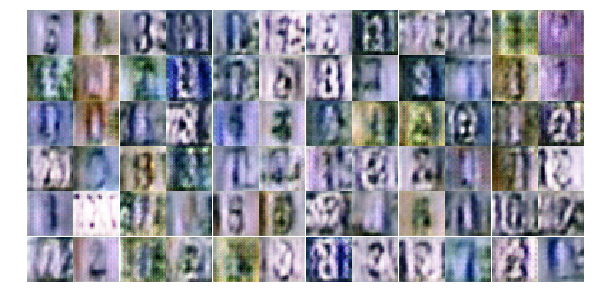

Epoch 3/25... Discriminator Loss: 1.3535... Generator Loss: 0.7173
Epoch 3/25... Discriminator Loss: 1.0669... Generator Loss: 0.7046
Epoch 3/25... Discriminator Loss: 1.0784... Generator Loss: 0.7391
Epoch 3/25... Discriminator Loss: 1.1428... Generator Loss: 1.0025
Epoch 3/25... Discriminator Loss: 1.0954... Generator Loss: 0.7988
Epoch 3/25... Discriminator Loss: 1.2616... Generator Loss: 0.8046
Epoch 3/25... Discriminator Loss: 1.5163... Generator Loss: 0.5890
Epoch 3/25... Discriminator Loss: 1.2201... Generator Loss: 0.9170
Epoch 3/25... Discriminator Loss: 1.1391... Generator Loss: 1.1417
Epoch 3/25... Discriminator Loss: 1.4578... Generator Loss: 0.4998


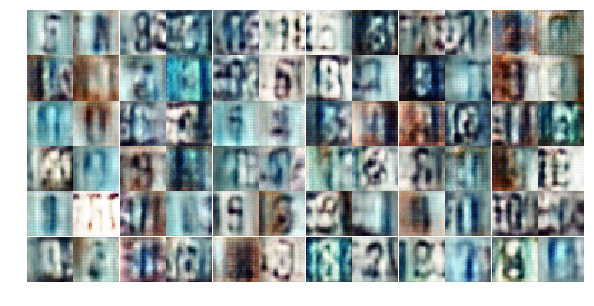

Epoch 3/25... Discriminator Loss: 1.1147... Generator Loss: 0.9415
Epoch 3/25... Discriminator Loss: 1.2879... Generator Loss: 0.6067
Epoch 3/25... Discriminator Loss: 1.1905... Generator Loss: 0.7371
Epoch 3/25... Discriminator Loss: 1.0463... Generator Loss: 0.9405
Epoch 3/25... Discriminator Loss: 1.0812... Generator Loss: 0.8451
Epoch 3/25... Discriminator Loss: 1.2134... Generator Loss: 1.2767
Epoch 3/25... Discriminator Loss: 1.1995... Generator Loss: 0.6931
Epoch 3/25... Discriminator Loss: 1.2550... Generator Loss: 0.7234
Epoch 3/25... Discriminator Loss: 1.0747... Generator Loss: 0.9529
Epoch 3/25... Discriminator Loss: 1.2779... Generator Loss: 0.8345


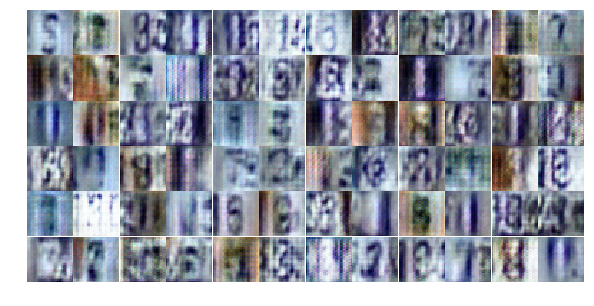

Epoch 3/25... Discriminator Loss: 1.1599... Generator Loss: 0.7233
Epoch 3/25... Discriminator Loss: 0.9889... Generator Loss: 0.8871
Epoch 3/25... Discriminator Loss: 1.1651... Generator Loss: 0.6795
Epoch 3/25... Discriminator Loss: 1.3238... Generator Loss: 0.6703
Epoch 3/25... Discriminator Loss: 1.3103... Generator Loss: 0.5551
Epoch 3/25... Discriminator Loss: 1.0411... Generator Loss: 0.8561
Epoch 3/25... Discriminator Loss: 1.0172... Generator Loss: 0.9741
Epoch 3/25... Discriminator Loss: 1.2494... Generator Loss: 0.6200
Epoch 3/25... Discriminator Loss: 1.3854... Generator Loss: 0.4817
Epoch 3/25... Discriminator Loss: 1.2684... Generator Loss: 0.5430


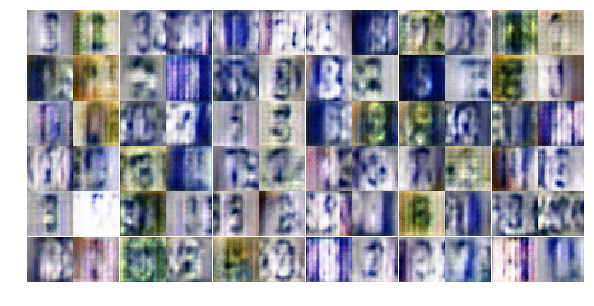

Epoch 3/25... Discriminator Loss: 1.2372... Generator Loss: 0.7433
Epoch 3/25... Discriminator Loss: 1.3218... Generator Loss: 0.5410
Epoch 3/25... Discriminator Loss: 1.0071... Generator Loss: 0.8777
Epoch 3/25... Discriminator Loss: 1.3475... Generator Loss: 0.6020
Epoch 3/25... Discriminator Loss: 1.1940... Generator Loss: 0.7215
Epoch 3/25... Discriminator Loss: 1.2307... Generator Loss: 0.5826
Epoch 3/25... Discriminator Loss: 1.1268... Generator Loss: 1.3124
Epoch 3/25... Discriminator Loss: 1.0350... Generator Loss: 0.8759
Epoch 3/25... Discriminator Loss: 1.0965... Generator Loss: 0.8119
Epoch 3/25... Discriminator Loss: 1.0523... Generator Loss: 0.8966


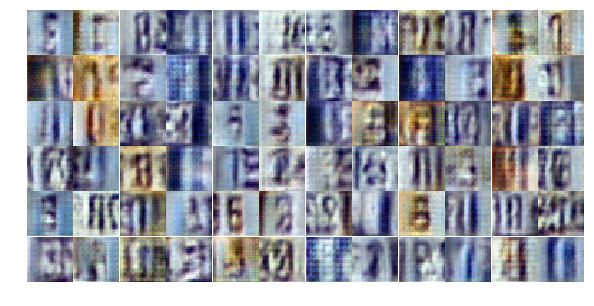

Epoch 3/25... Discriminator Loss: 1.1472... Generator Loss: 0.9660
Epoch 3/25... Discriminator Loss: 1.3652... Generator Loss: 0.9972
Epoch 3/25... Discriminator Loss: 1.0883... Generator Loss: 0.7503
Epoch 3/25... Discriminator Loss: 1.4030... Generator Loss: 0.4956
Epoch 3/25... Discriminator Loss: 1.1233... Generator Loss: 1.1708
Epoch 3/25... Discriminator Loss: 1.5430... Generator Loss: 0.4015
Epoch 3/25... Discriminator Loss: 0.9118... Generator Loss: 1.1219
Epoch 3/25... Discriminator Loss: 1.3738... Generator Loss: 0.4675
Epoch 3/25... Discriminator Loss: 1.2074... Generator Loss: 0.7250
Epoch 3/25... Discriminator Loss: 1.3541... Generator Loss: 0.6858


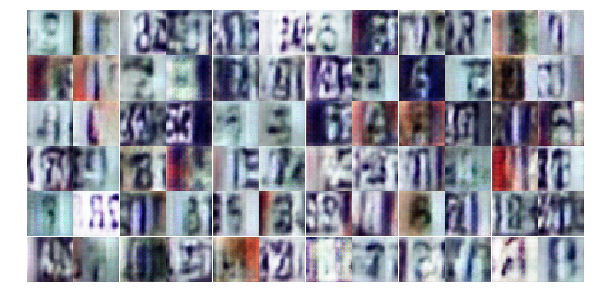

Epoch 3/25... Discriminator Loss: 1.0810... Generator Loss: 0.9416
Epoch 3/25... Discriminator Loss: 1.2421... Generator Loss: 0.6461
Epoch 3/25... Discriminator Loss: 1.1658... Generator Loss: 0.6980
Epoch 3/25... Discriminator Loss: 1.0444... Generator Loss: 0.8527
Epoch 3/25... Discriminator Loss: 1.1093... Generator Loss: 0.8648
Epoch 3/25... Discriminator Loss: 1.2783... Generator Loss: 0.6484
Epoch 3/25... Discriminator Loss: 1.1927... Generator Loss: 0.7578
Epoch 3/25... Discriminator Loss: 1.1378... Generator Loss: 0.6974
Epoch 3/25... Discriminator Loss: 1.6827... Generator Loss: 0.3220
Epoch 3/25... Discriminator Loss: 1.1277... Generator Loss: 0.8521


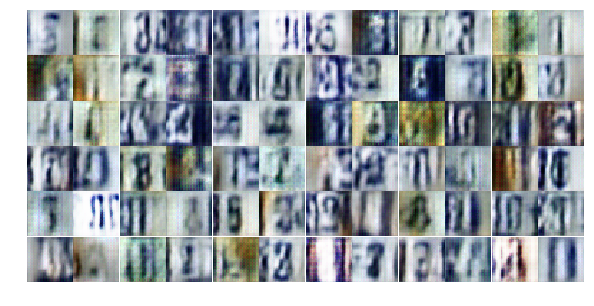

Epoch 3/25... Discriminator Loss: 1.2301... Generator Loss: 0.6028
Epoch 3/25... Discriminator Loss: 1.1964... Generator Loss: 0.7741
Epoch 3/25... Discriminator Loss: 1.2852... Generator Loss: 0.7222
Epoch 3/25... Discriminator Loss: 1.2226... Generator Loss: 0.5989
Epoch 3/25... Discriminator Loss: 1.1274... Generator Loss: 0.6644
Epoch 3/25... Discriminator Loss: 1.3248... Generator Loss: 0.7733
Epoch 3/25... Discriminator Loss: 1.3681... Generator Loss: 0.6397
Epoch 3/25... Discriminator Loss: 1.4021... Generator Loss: 0.4947
Epoch 3/25... Discriminator Loss: 1.1263... Generator Loss: 0.6038
Epoch 3/25... Discriminator Loss: 1.2417... Generator Loss: 0.5521


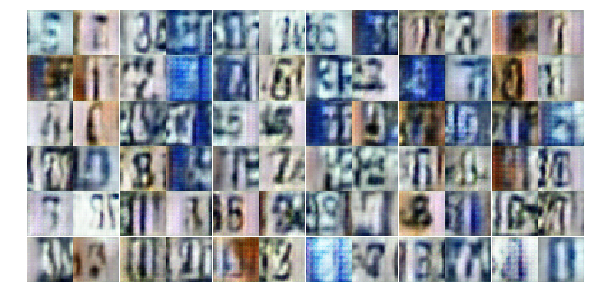

Epoch 3/25... Discriminator Loss: 1.4014... Generator Loss: 0.4739
Epoch 3/25... Discriminator Loss: 1.0805... Generator Loss: 0.9217
Epoch 3/25... Discriminator Loss: 1.2729... Generator Loss: 0.6234
Epoch 4/25... Discriminator Loss: 1.3370... Generator Loss: 0.9888
Epoch 4/25... Discriminator Loss: 1.2624... Generator Loss: 0.5984
Epoch 4/25... Discriminator Loss: 1.2045... Generator Loss: 0.7860
Epoch 4/25... Discriminator Loss: 1.1558... Generator Loss: 0.6794
Epoch 4/25... Discriminator Loss: 1.4861... Generator Loss: 0.3867
Epoch 4/25... Discriminator Loss: 2.0206... Generator Loss: 0.2308
Epoch 4/25... Discriminator Loss: 1.1709... Generator Loss: 1.1108


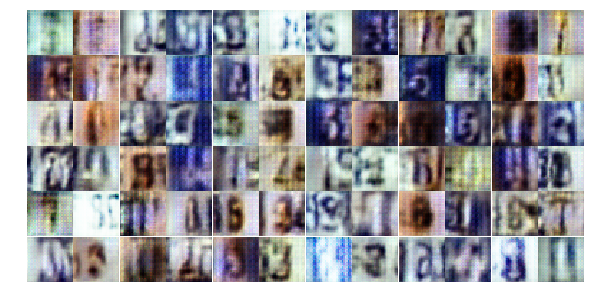

Epoch 4/25... Discriminator Loss: 1.3628... Generator Loss: 0.6218
Epoch 4/25... Discriminator Loss: 1.0025... Generator Loss: 0.9769
Epoch 4/25... Discriminator Loss: 1.3414... Generator Loss: 0.6327
Epoch 4/25... Discriminator Loss: 1.2437... Generator Loss: 0.5874
Epoch 4/25... Discriminator Loss: 1.4480... Generator Loss: 0.6139
Epoch 4/25... Discriminator Loss: 0.9016... Generator Loss: 1.0056
Epoch 4/25... Discriminator Loss: 1.4211... Generator Loss: 0.5056
Epoch 4/25... Discriminator Loss: 1.0923... Generator Loss: 0.8318
Epoch 4/25... Discriminator Loss: 1.5125... Generator Loss: 0.4056
Epoch 4/25... Discriminator Loss: 1.2260... Generator Loss: 0.5957


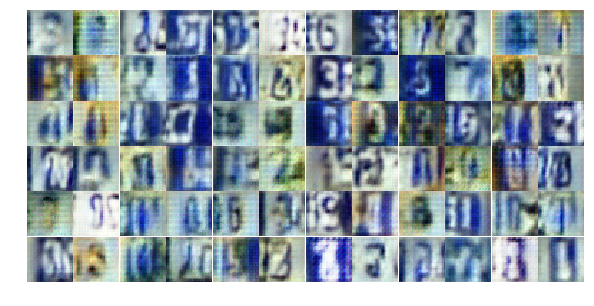

Epoch 4/25... Discriminator Loss: 1.5873... Generator Loss: 0.3765
Epoch 4/25... Discriminator Loss: 1.3156... Generator Loss: 0.6880
Epoch 4/25... Discriminator Loss: 1.2849... Generator Loss: 0.9523
Epoch 4/25... Discriminator Loss: 1.2601... Generator Loss: 1.0456
Epoch 4/25... Discriminator Loss: 1.2226... Generator Loss: 0.8385
Epoch 4/25... Discriminator Loss: 1.3656... Generator Loss: 0.4363
Epoch 4/25... Discriminator Loss: 1.3834... Generator Loss: 0.4143
Epoch 4/25... Discriminator Loss: 1.2039... Generator Loss: 0.7430
Epoch 4/25... Discriminator Loss: 1.3666... Generator Loss: 0.5894
Epoch 4/25... Discriminator Loss: 1.3790... Generator Loss: 1.1840


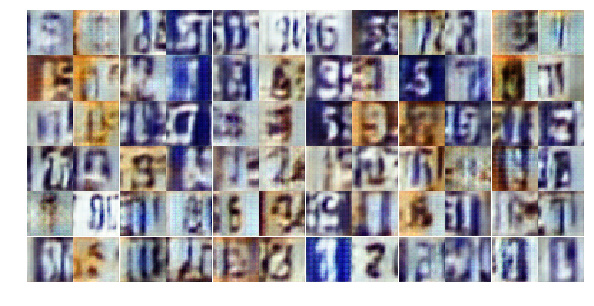

Epoch 4/25... Discriminator Loss: 1.2319... Generator Loss: 0.7836
Epoch 4/25... Discriminator Loss: 1.1552... Generator Loss: 1.0272
Epoch 4/25... Discriminator Loss: 1.1563... Generator Loss: 0.8252
Epoch 4/25... Discriminator Loss: 1.2718... Generator Loss: 0.6314
Epoch 4/25... Discriminator Loss: 1.2356... Generator Loss: 0.8590
Epoch 4/25... Discriminator Loss: 1.2183... Generator Loss: 0.6829
Epoch 4/25... Discriminator Loss: 1.3034... Generator Loss: 0.5712
Epoch 4/25... Discriminator Loss: 1.2588... Generator Loss: 0.7527
Epoch 4/25... Discriminator Loss: 1.2161... Generator Loss: 0.5312
Epoch 4/25... Discriminator Loss: 1.2831... Generator Loss: 0.4982


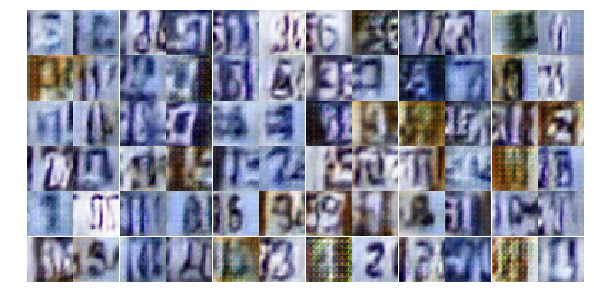

Epoch 4/25... Discriminator Loss: 1.1748... Generator Loss: 0.8026
Epoch 4/25... Discriminator Loss: 1.1385... Generator Loss: 0.8159
Epoch 4/25... Discriminator Loss: 1.1924... Generator Loss: 0.8327
Epoch 4/25... Discriminator Loss: 1.2403... Generator Loss: 0.6733
Epoch 4/25... Discriminator Loss: 1.2449... Generator Loss: 0.5312
Epoch 4/25... Discriminator Loss: 1.1835... Generator Loss: 0.5532
Epoch 4/25... Discriminator Loss: 1.1655... Generator Loss: 0.5915
Epoch 4/25... Discriminator Loss: 1.1670... Generator Loss: 0.6778
Epoch 4/25... Discriminator Loss: 1.6088... Generator Loss: 0.5241
Epoch 4/25... Discriminator Loss: 1.1144... Generator Loss: 0.8074


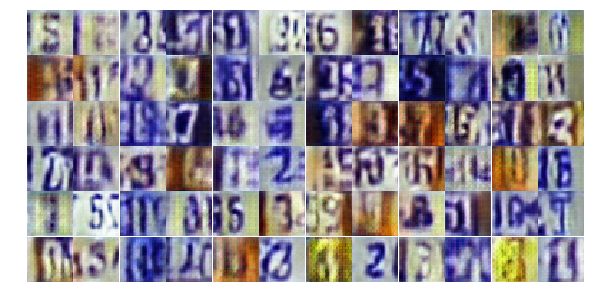

Epoch 4/25... Discriminator Loss: 1.3659... Generator Loss: 0.4474
Epoch 4/25... Discriminator Loss: 1.0846... Generator Loss: 0.8755
Epoch 4/25... Discriminator Loss: 1.1201... Generator Loss: 0.6802
Epoch 4/25... Discriminator Loss: 1.1339... Generator Loss: 0.5703
Epoch 4/25... Discriminator Loss: 1.4164... Generator Loss: 0.4172
Epoch 4/25... Discriminator Loss: 1.1069... Generator Loss: 0.8270
Epoch 4/25... Discriminator Loss: 1.0076... Generator Loss: 0.7828
Epoch 4/25... Discriminator Loss: 1.1938... Generator Loss: 0.7893
Epoch 4/25... Discriminator Loss: 1.4011... Generator Loss: 0.4619
Epoch 4/25... Discriminator Loss: 1.2251... Generator Loss: 1.3230


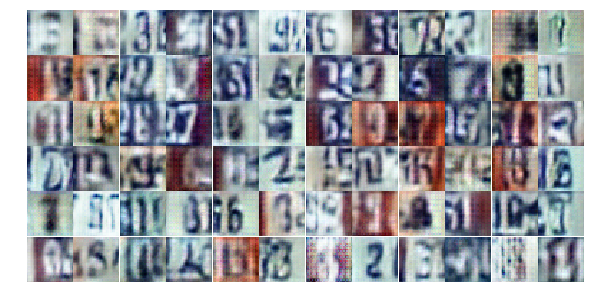

Epoch 4/25... Discriminator Loss: 1.1044... Generator Loss: 0.6692
Epoch 4/25... Discriminator Loss: 1.4042... Generator Loss: 0.4087
Epoch 4/25... Discriminator Loss: 1.2988... Generator Loss: 0.6223
Epoch 4/25... Discriminator Loss: 1.0301... Generator Loss: 0.8998
Epoch 4/25... Discriminator Loss: 1.1858... Generator Loss: 0.7033
Epoch 4/25... Discriminator Loss: 1.2555... Generator Loss: 0.6333
Epoch 4/25... Discriminator Loss: 1.4093... Generator Loss: 0.4555
Epoch 4/25... Discriminator Loss: 1.2826... Generator Loss: 0.6751
Epoch 4/25... Discriminator Loss: 1.2679... Generator Loss: 0.6634
Epoch 4/25... Discriminator Loss: 1.1169... Generator Loss: 0.7567


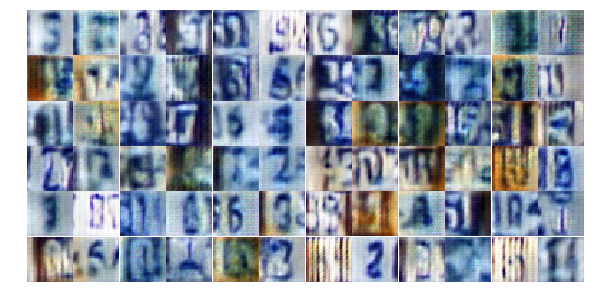

Epoch 4/25... Discriminator Loss: 1.0420... Generator Loss: 1.2074
Epoch 4/25... Discriminator Loss: 1.5600... Generator Loss: 0.3433
Epoch 4/25... Discriminator Loss: 1.0004... Generator Loss: 1.0577
Epoch 4/25... Discriminator Loss: 1.4587... Generator Loss: 0.4597
Epoch 4/25... Discriminator Loss: 1.1676... Generator Loss: 0.6114
Epoch 4/25... Discriminator Loss: 0.9114... Generator Loss: 0.9078
Epoch 4/25... Discriminator Loss: 1.3090... Generator Loss: 0.5915
Epoch 4/25... Discriminator Loss: 1.5647... Generator Loss: 0.3928
Epoch 4/25... Discriminator Loss: 1.0829... Generator Loss: 0.6121
Epoch 4/25... Discriminator Loss: 1.1743... Generator Loss: 0.6127


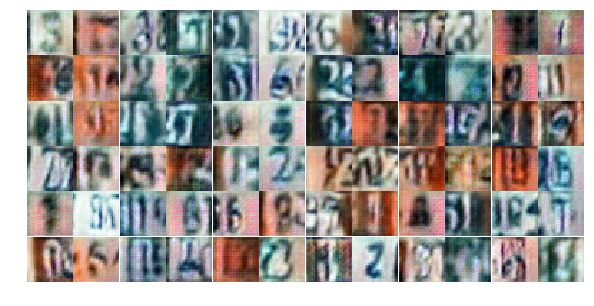

Epoch 4/25... Discriminator Loss: 1.6132... Generator Loss: 0.4688
Epoch 4/25... Discriminator Loss: 1.3866... Generator Loss: 0.4779
Epoch 4/25... Discriminator Loss: 0.9215... Generator Loss: 0.9015
Epoch 4/25... Discriminator Loss: 1.3677... Generator Loss: 0.7150
Epoch 4/25... Discriminator Loss: 1.3999... Generator Loss: 0.4766
Epoch 4/25... Discriminator Loss: 1.2488... Generator Loss: 0.5472
Epoch 4/25... Discriminator Loss: 0.9116... Generator Loss: 0.9088
Epoch 4/25... Discriminator Loss: 1.4334... Generator Loss: 0.4356
Epoch 4/25... Discriminator Loss: 1.0737... Generator Loss: 0.7560
Epoch 4/25... Discriminator Loss: 1.1483... Generator Loss: 0.7026


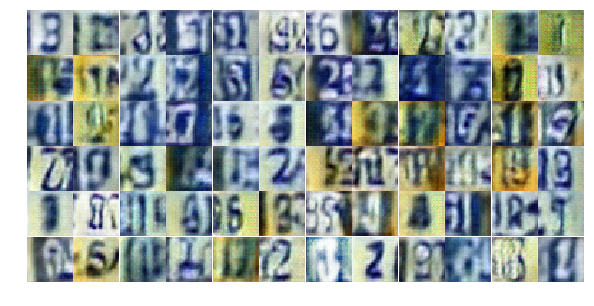

Epoch 4/25... Discriminator Loss: 1.2096... Generator Loss: 0.6830
Epoch 4/25... Discriminator Loss: 1.3181... Generator Loss: 0.4753
Epoch 4/25... Discriminator Loss: 1.2002... Generator Loss: 0.8225
Epoch 4/25... Discriminator Loss: 1.4835... Generator Loss: 0.4152
Epoch 4/25... Discriminator Loss: 1.2292... Generator Loss: 0.8566
Epoch 4/25... Discriminator Loss: 1.0572... Generator Loss: 0.8528
Epoch 4/25... Discriminator Loss: 1.3898... Generator Loss: 0.4929
Epoch 4/25... Discriminator Loss: 1.3291... Generator Loss: 0.4608
Epoch 4/25... Discriminator Loss: 1.3333... Generator Loss: 0.6016
Epoch 4/25... Discriminator Loss: 1.2917... Generator Loss: 0.5974


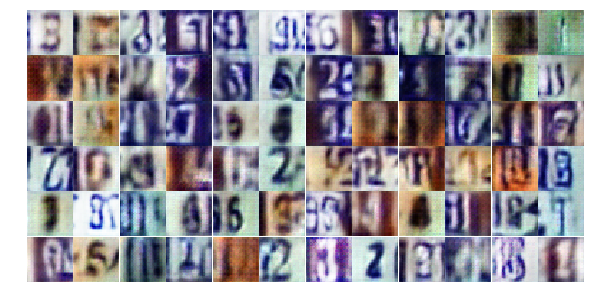

Epoch 4/25... Discriminator Loss: 1.2381... Generator Loss: 0.7107
Epoch 4/25... Discriminator Loss: 1.0604... Generator Loss: 0.8981
Epoch 4/25... Discriminator Loss: 1.3351... Generator Loss: 0.4234
Epoch 4/25... Discriminator Loss: 1.3678... Generator Loss: 0.5188
Epoch 4/25... Discriminator Loss: 1.1449... Generator Loss: 0.8536
Epoch 4/25... Discriminator Loss: 1.6373... Generator Loss: 0.4234
Epoch 4/25... Discriminator Loss: 1.4456... Generator Loss: 0.4123
Epoch 4/25... Discriminator Loss: 1.2788... Generator Loss: 0.6248
Epoch 4/25... Discriminator Loss: 0.7424... Generator Loss: 1.1610
Epoch 4/25... Discriminator Loss: 1.1541... Generator Loss: 0.6620


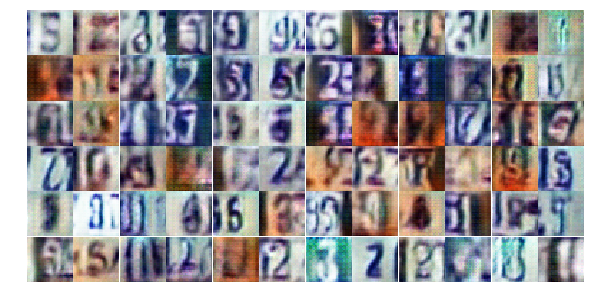

Epoch 4/25... Discriminator Loss: 0.9733... Generator Loss: 0.8287
Epoch 4/25... Discriminator Loss: 1.3324... Generator Loss: 0.5161
Epoch 4/25... Discriminator Loss: 1.0707... Generator Loss: 0.9138
Epoch 4/25... Discriminator Loss: 1.4537... Generator Loss: 0.3844
Epoch 4/25... Discriminator Loss: 1.1990... Generator Loss: 0.6571
Epoch 4/25... Discriminator Loss: 1.1435... Generator Loss: 0.9427
Epoch 4/25... Discriminator Loss: 1.4391... Generator Loss: 0.3724
Epoch 4/25... Discriminator Loss: 1.0263... Generator Loss: 0.7978
Epoch 5/25... Discriminator Loss: 1.5897... Generator Loss: 0.3555
Epoch 5/25... Discriminator Loss: 1.3442... Generator Loss: 0.5260


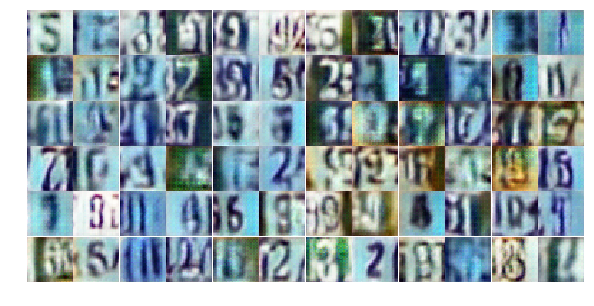

Epoch 5/25... Discriminator Loss: 0.9480... Generator Loss: 0.8037
Epoch 5/25... Discriminator Loss: 1.1905... Generator Loss: 0.5999
Epoch 5/25... Discriminator Loss: 0.9965... Generator Loss: 0.9035
Epoch 5/25... Discriminator Loss: 0.9586... Generator Loss: 1.2998
Epoch 5/25... Discriminator Loss: 1.1243... Generator Loss: 0.6457
Epoch 5/25... Discriminator Loss: 1.1754... Generator Loss: 0.5597
Epoch 5/25... Discriminator Loss: 1.0752... Generator Loss: 0.8031
Epoch 5/25... Discriminator Loss: 1.3827... Generator Loss: 0.4597
Epoch 5/25... Discriminator Loss: 1.5515... Generator Loss: 0.4095
Epoch 5/25... Discriminator Loss: 1.1711... Generator Loss: 0.6738


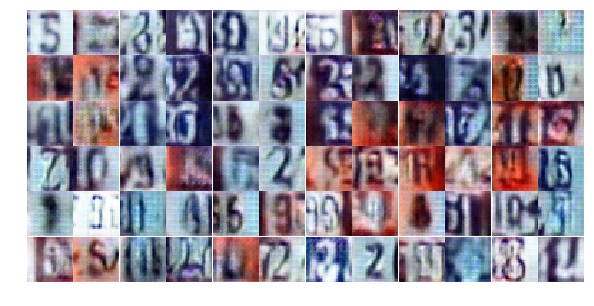

Epoch 5/25... Discriminator Loss: 1.0826... Generator Loss: 0.7411
Epoch 5/25... Discriminator Loss: 0.9493... Generator Loss: 0.9929
Epoch 5/25... Discriminator Loss: 1.4176... Generator Loss: 0.4126
Epoch 5/25... Discriminator Loss: 0.9104... Generator Loss: 0.8841
Epoch 5/25... Discriminator Loss: 1.2305... Generator Loss: 1.2146
Epoch 5/25... Discriminator Loss: 1.3491... Generator Loss: 0.5658
Epoch 5/25... Discriminator Loss: 0.9627... Generator Loss: 0.8332
Epoch 5/25... Discriminator Loss: 0.9735... Generator Loss: 1.1891
Epoch 5/25... Discriminator Loss: 1.0570... Generator Loss: 0.7994
Epoch 5/25... Discriminator Loss: 1.1608... Generator Loss: 0.5932


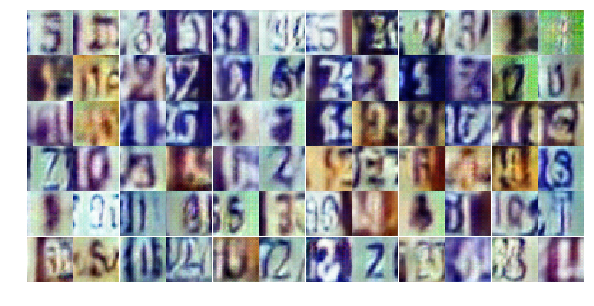

Epoch 5/25... Discriminator Loss: 1.0485... Generator Loss: 0.7471
Epoch 5/25... Discriminator Loss: 0.9868... Generator Loss: 0.7711
Epoch 5/25... Discriminator Loss: 0.9347... Generator Loss: 0.8288
Epoch 5/25... Discriminator Loss: 1.0610... Generator Loss: 0.8658
Epoch 5/25... Discriminator Loss: 0.9546... Generator Loss: 0.8948
Epoch 5/25... Discriminator Loss: 0.9831... Generator Loss: 0.9871
Epoch 5/25... Discriminator Loss: 1.2750... Generator Loss: 0.4897
Epoch 5/25... Discriminator Loss: 0.8120... Generator Loss: 0.9880
Epoch 5/25... Discriminator Loss: 1.3489... Generator Loss: 0.4764
Epoch 5/25... Discriminator Loss: 1.0257... Generator Loss: 0.7440


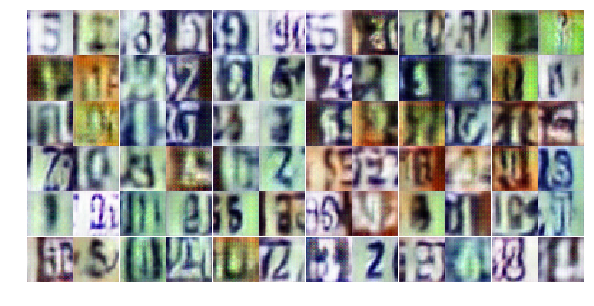

Epoch 5/25... Discriminator Loss: 1.2330... Generator Loss: 0.7243
Epoch 5/25... Discriminator Loss: 1.0689... Generator Loss: 0.6758
Epoch 5/25... Discriminator Loss: 1.1306... Generator Loss: 0.5437
Epoch 5/25... Discriminator Loss: 0.9053... Generator Loss: 1.0202
Epoch 5/25... Discriminator Loss: 1.1530... Generator Loss: 1.0143
Epoch 5/25... Discriminator Loss: 1.7132... Generator Loss: 0.2923
Epoch 5/25... Discriminator Loss: 1.0063... Generator Loss: 0.9831
Epoch 5/25... Discriminator Loss: 1.0008... Generator Loss: 0.7504
Epoch 5/25... Discriminator Loss: 1.2273... Generator Loss: 0.5087
Epoch 5/25... Discriminator Loss: 0.7534... Generator Loss: 0.9596


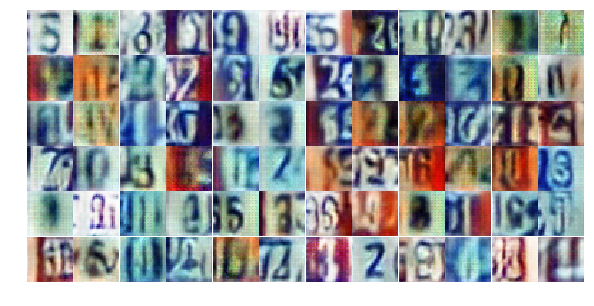

Epoch 5/25... Discriminator Loss: 1.5965... Generator Loss: 0.3090
Epoch 5/25... Discriminator Loss: 1.0851... Generator Loss: 0.7291
Epoch 5/25... Discriminator Loss: 1.1947... Generator Loss: 0.5608
Epoch 5/25... Discriminator Loss: 0.6650... Generator Loss: 2.0177
Epoch 5/25... Discriminator Loss: 1.5823... Generator Loss: 0.3285
Epoch 5/25... Discriminator Loss: 1.3285... Generator Loss: 0.7502
Epoch 5/25... Discriminator Loss: 1.1166... Generator Loss: 0.5811
Epoch 5/25... Discriminator Loss: 1.2379... Generator Loss: 0.9379
Epoch 5/25... Discriminator Loss: 1.4529... Generator Loss: 0.5342
Epoch 5/25... Discriminator Loss: 0.9847... Generator Loss: 1.1601


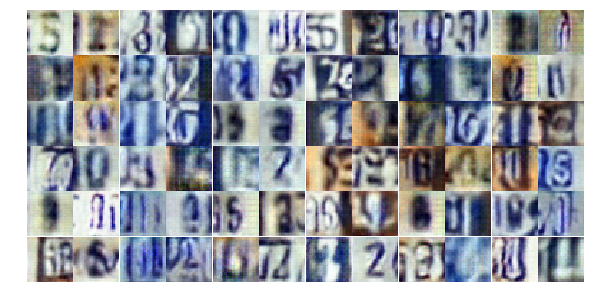

Epoch 5/25... Discriminator Loss: 1.3104... Generator Loss: 0.5606
Epoch 5/25... Discriminator Loss: 1.3059... Generator Loss: 0.5104
Epoch 5/25... Discriminator Loss: 1.0164... Generator Loss: 0.7359
Epoch 5/25... Discriminator Loss: 0.9082... Generator Loss: 0.8935
Epoch 5/25... Discriminator Loss: 0.8097... Generator Loss: 1.2127
Epoch 5/25... Discriminator Loss: 1.3496... Generator Loss: 1.3863
Epoch 5/25... Discriminator Loss: 1.3890... Generator Loss: 1.1050
Epoch 5/25... Discriminator Loss: 0.7542... Generator Loss: 1.1884
Epoch 5/25... Discriminator Loss: 1.1765... Generator Loss: 0.6252
Epoch 5/25... Discriminator Loss: 1.1916... Generator Loss: 0.7529


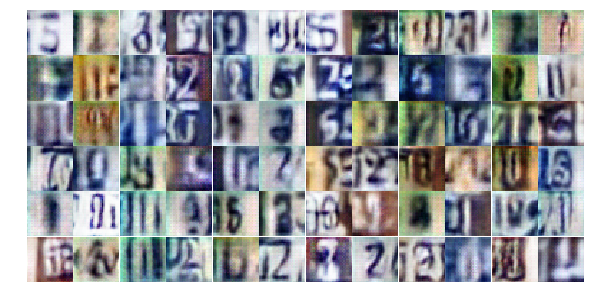

Epoch 5/25... Discriminator Loss: 1.0386... Generator Loss: 0.7167
Epoch 5/25... Discriminator Loss: 0.9879... Generator Loss: 0.9994
Epoch 5/25... Discriminator Loss: 1.1185... Generator Loss: 0.5706
Epoch 5/25... Discriminator Loss: 0.9937... Generator Loss: 1.2834
Epoch 5/25... Discriminator Loss: 1.3996... Generator Loss: 0.3993
Epoch 5/25... Discriminator Loss: 0.9206... Generator Loss: 1.0411
Epoch 5/25... Discriminator Loss: 0.7961... Generator Loss: 1.3601
Epoch 5/25... Discriminator Loss: 1.6966... Generator Loss: 0.3148
Epoch 5/25... Discriminator Loss: 1.4587... Generator Loss: 0.4722
Epoch 5/25... Discriminator Loss: 0.7624... Generator Loss: 1.3260


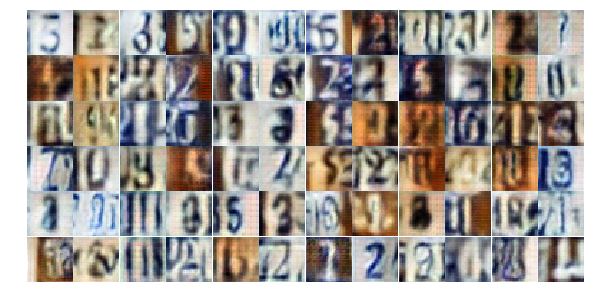

Epoch 5/25... Discriminator Loss: 1.9899... Generator Loss: 0.2269
Epoch 5/25... Discriminator Loss: 0.8906... Generator Loss: 1.0557
Epoch 5/25... Discriminator Loss: 1.4701... Generator Loss: 0.4397
Epoch 5/25... Discriminator Loss: 1.0411... Generator Loss: 0.7559
Epoch 5/25... Discriminator Loss: 1.8389... Generator Loss: 0.2427
Epoch 5/25... Discriminator Loss: 1.2941... Generator Loss: 1.1166
Epoch 5/25... Discriminator Loss: 1.2514... Generator Loss: 0.5840
Epoch 5/25... Discriminator Loss: 1.0265... Generator Loss: 0.7710
Epoch 5/25... Discriminator Loss: 0.3561... Generator Loss: 2.1965
Epoch 5/25... Discriminator Loss: 0.9713... Generator Loss: 1.0359


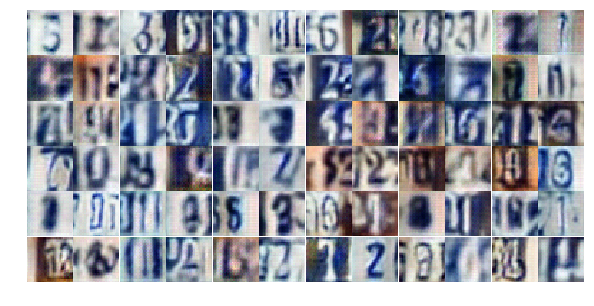

Epoch 5/25... Discriminator Loss: 0.8097... Generator Loss: 1.3251
Epoch 5/25... Discriminator Loss: 1.2536... Generator Loss: 0.4836
Epoch 5/25... Discriminator Loss: 1.2244... Generator Loss: 0.5954
Epoch 5/25... Discriminator Loss: 0.7303... Generator Loss: 1.3787
Epoch 5/25... Discriminator Loss: 1.1001... Generator Loss: 0.7873
Epoch 5/25... Discriminator Loss: 0.6215... Generator Loss: 1.5780
Epoch 5/25... Discriminator Loss: 1.4124... Generator Loss: 0.4106
Epoch 5/25... Discriminator Loss: 1.0636... Generator Loss: 0.7754
Epoch 5/25... Discriminator Loss: 1.8435... Generator Loss: 0.2260
Epoch 5/25... Discriminator Loss: 1.2417... Generator Loss: 1.0755


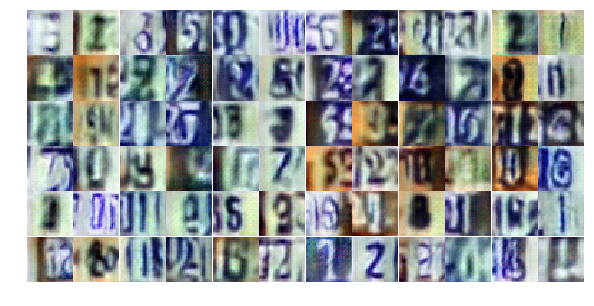

Epoch 5/25... Discriminator Loss: 1.3839... Generator Loss: 0.4194
Epoch 5/25... Discriminator Loss: 0.7902... Generator Loss: 1.1081
Epoch 5/25... Discriminator Loss: 1.2092... Generator Loss: 0.5670
Epoch 5/25... Discriminator Loss: 1.4326... Generator Loss: 0.4094
Epoch 5/25... Discriminator Loss: 0.7609... Generator Loss: 1.1694
Epoch 5/25... Discriminator Loss: 0.8510... Generator Loss: 0.8851
Epoch 5/25... Discriminator Loss: 1.1437... Generator Loss: 0.6540
Epoch 5/25... Discriminator Loss: 1.0382... Generator Loss: 0.7066
Epoch 5/25... Discriminator Loss: 1.1749... Generator Loss: 0.9032
Epoch 5/25... Discriminator Loss: 0.8412... Generator Loss: 1.0955


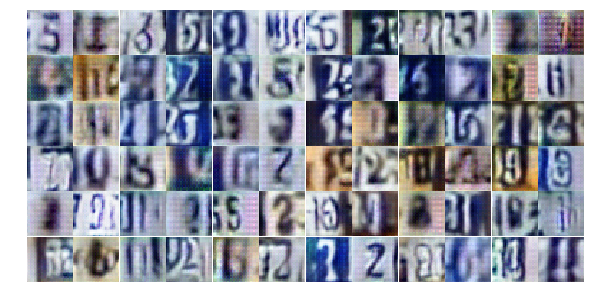

Epoch 5/25... Discriminator Loss: 1.2179... Generator Loss: 0.5720
Epoch 5/25... Discriminator Loss: 1.1216... Generator Loss: 1.4547
Epoch 5/25... Discriminator Loss: 1.0023... Generator Loss: 1.0838
Epoch 5/25... Discriminator Loss: 0.9824... Generator Loss: 0.7222
Epoch 5/25... Discriminator Loss: 1.3265... Generator Loss: 0.8144
Epoch 5/25... Discriminator Loss: 1.1484... Generator Loss: 1.0683
Epoch 5/25... Discriminator Loss: 1.1930... Generator Loss: 0.5395
Epoch 5/25... Discriminator Loss: 1.1923... Generator Loss: 0.5030
Epoch 5/25... Discriminator Loss: 0.8010... Generator Loss: 0.8265
Epoch 5/25... Discriminator Loss: 1.2993... Generator Loss: 0.4836


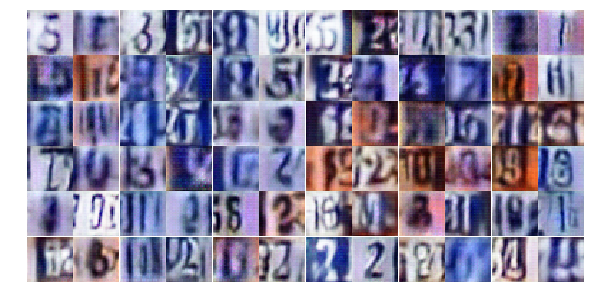

Epoch 5/25... Discriminator Loss: 0.9391... Generator Loss: 1.1833
Epoch 5/25... Discriminator Loss: 1.4660... Generator Loss: 1.7700
Epoch 6/25... Discriminator Loss: 1.3429... Generator Loss: 0.4668
Epoch 6/25... Discriminator Loss: 0.8472... Generator Loss: 1.0468
Epoch 6/25... Discriminator Loss: 1.1216... Generator Loss: 0.5566
Epoch 6/25... Discriminator Loss: 0.9506... Generator Loss: 0.9852
Epoch 6/25... Discriminator Loss: 0.6095... Generator Loss: 1.0627
Epoch 6/25... Discriminator Loss: 1.2147... Generator Loss: 0.6034
Epoch 6/25... Discriminator Loss: 0.9296... Generator Loss: 0.8654
Epoch 6/25... Discriminator Loss: 0.8571... Generator Loss: 1.9424


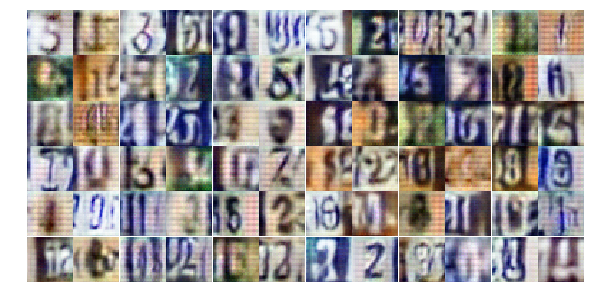

Epoch 6/25... Discriminator Loss: 1.0588... Generator Loss: 0.8452
Epoch 6/25... Discriminator Loss: 0.5952... Generator Loss: 1.1459
Epoch 6/25... Discriminator Loss: 1.8048... Generator Loss: 0.2447
Epoch 6/25... Discriminator Loss: 0.9715... Generator Loss: 0.8417
Epoch 6/25... Discriminator Loss: 0.9274... Generator Loss: 0.9994
Epoch 6/25... Discriminator Loss: 1.2093... Generator Loss: 0.5790
Epoch 6/25... Discriminator Loss: 0.8686... Generator Loss: 0.8572
Epoch 6/25... Discriminator Loss: 1.3294... Generator Loss: 0.8069
Epoch 6/25... Discriminator Loss: 1.1018... Generator Loss: 0.7799
Epoch 6/25... Discriminator Loss: 1.1028... Generator Loss: 0.5994


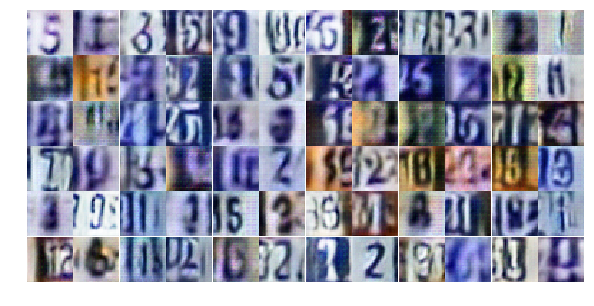

Epoch 6/25... Discriminator Loss: 1.4180... Generator Loss: 1.4442
Epoch 6/25... Discriminator Loss: 1.3166... Generator Loss: 0.8620
Epoch 6/25... Discriminator Loss: 0.9507... Generator Loss: 0.8319
Epoch 6/25... Discriminator Loss: 1.4803... Generator Loss: 0.3871
Epoch 6/25... Discriminator Loss: 0.5425... Generator Loss: 1.4675
Epoch 6/25... Discriminator Loss: 1.2107... Generator Loss: 0.4924
Epoch 6/25... Discriminator Loss: 1.7309... Generator Loss: 0.2595
Epoch 6/25... Discriminator Loss: 1.2803... Generator Loss: 0.4880
Epoch 6/25... Discriminator Loss: 0.7558... Generator Loss: 1.4096
Epoch 6/25... Discriminator Loss: 1.0496... Generator Loss: 0.6517


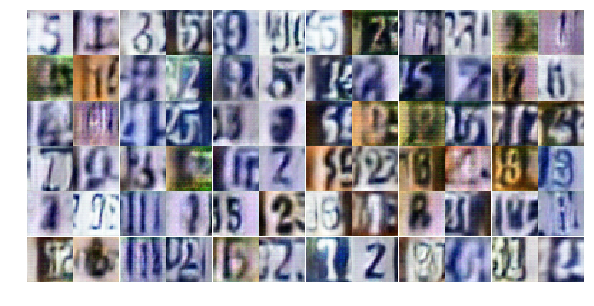

Epoch 6/25... Discriminator Loss: 1.0752... Generator Loss: 1.3216
Epoch 6/25... Discriminator Loss: 1.1739... Generator Loss: 0.6047
Epoch 6/25... Discriminator Loss: 1.2648... Generator Loss: 1.3932
Epoch 6/25... Discriminator Loss: 1.5623... Generator Loss: 1.0595
Epoch 6/25... Discriminator Loss: 1.0783... Generator Loss: 0.7901
Epoch 6/25... Discriminator Loss: 1.3565... Generator Loss: 0.8211
Epoch 6/25... Discriminator Loss: 1.2837... Generator Loss: 0.5297
Epoch 6/25... Discriminator Loss: 1.0642... Generator Loss: 0.6423
Epoch 6/25... Discriminator Loss: 0.8777... Generator Loss: 1.0061
Epoch 6/25... Discriminator Loss: 1.1658... Generator Loss: 0.7513


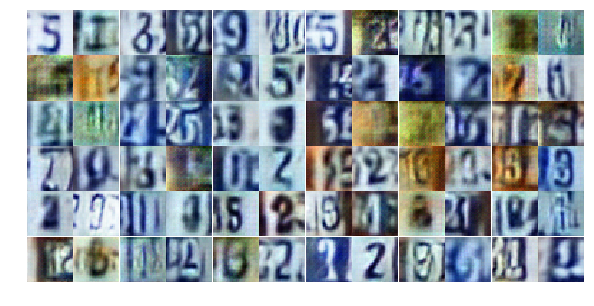

Epoch 6/25... Discriminator Loss: 1.2022... Generator Loss: 0.6253
Epoch 6/25... Discriminator Loss: 0.9834... Generator Loss: 1.3246
Epoch 6/25... Discriminator Loss: 1.0155... Generator Loss: 0.6075
Epoch 6/25... Discriminator Loss: 1.2808... Generator Loss: 0.4670
Epoch 6/25... Discriminator Loss: 1.1330... Generator Loss: 0.5658
Epoch 6/25... Discriminator Loss: 1.6979... Generator Loss: 0.2975
Epoch 6/25... Discriminator Loss: 1.0902... Generator Loss: 0.5954
Epoch 6/25... Discriminator Loss: 1.7025... Generator Loss: 0.3700
Epoch 6/25... Discriminator Loss: 0.7750... Generator Loss: 1.0542
Epoch 6/25... Discriminator Loss: 1.5067... Generator Loss: 0.4287


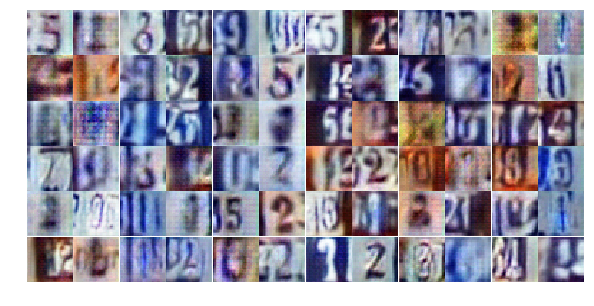

Epoch 6/25... Discriminator Loss: 0.7684... Generator Loss: 1.1354
Epoch 6/25... Discriminator Loss: 1.0458... Generator Loss: 0.6223
Epoch 6/25... Discriminator Loss: 1.0101... Generator Loss: 0.7199
Epoch 6/25... Discriminator Loss: 1.3574... Generator Loss: 0.4209
Epoch 6/25... Discriminator Loss: 1.1026... Generator Loss: 0.5811
Epoch 6/25... Discriminator Loss: 0.7288... Generator Loss: 1.3147
Epoch 6/25... Discriminator Loss: 0.9771... Generator Loss: 1.0072
Epoch 6/25... Discriminator Loss: 1.3672... Generator Loss: 0.4474
Epoch 6/25... Discriminator Loss: 0.9122... Generator Loss: 0.8686
Epoch 6/25... Discriminator Loss: 0.7677... Generator Loss: 0.9289


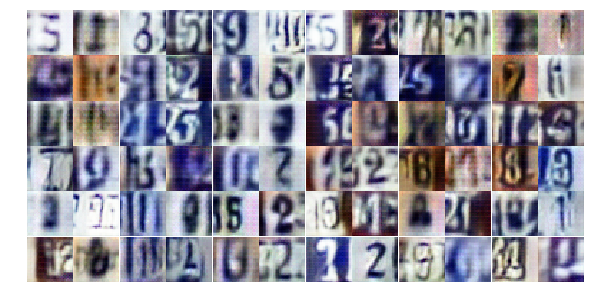

Epoch 6/25... Discriminator Loss: 2.2378... Generator Loss: 0.1717
Epoch 6/25... Discriminator Loss: 0.9250... Generator Loss: 0.8636
Epoch 6/25... Discriminator Loss: 0.7514... Generator Loss: 0.9430
Epoch 6/25... Discriminator Loss: 0.4460... Generator Loss: 2.1626
Epoch 6/25... Discriminator Loss: 1.0152... Generator Loss: 0.8499
Epoch 6/25... Discriminator Loss: 1.5459... Generator Loss: 0.4421
Epoch 6/25... Discriminator Loss: 1.0867... Generator Loss: 0.6277
Epoch 6/25... Discriminator Loss: 0.6807... Generator Loss: 1.4994
Epoch 6/25... Discriminator Loss: 1.2849... Generator Loss: 0.4833
Epoch 6/25... Discriminator Loss: 1.6068... Generator Loss: 0.4271


In [ ]:
dataset = Dataset(trainset, testset)

losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

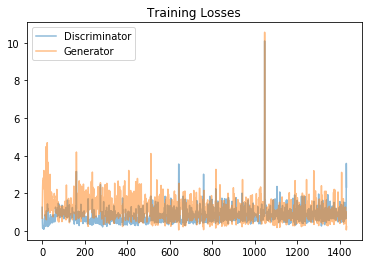

In [18]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

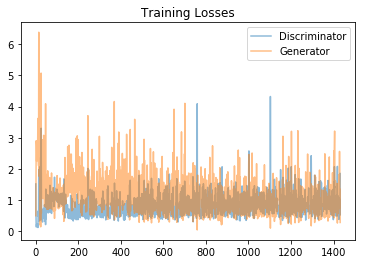

In [18]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

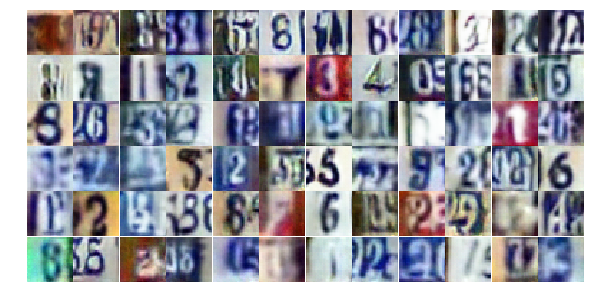

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))

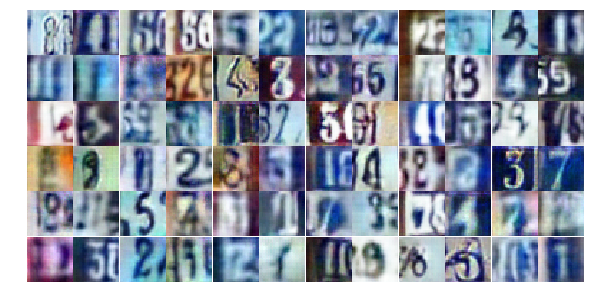

In [19]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))